In [1]:
import sys
sys.path.append('./ukb_func')
import rfb
import icd
import ml_utils
import dementia_utils
import df_utils

import os
import pandas as pd
import numpy as np
from sklearn.ensemble import HistGradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold, train_test_split, cross_validate, cross_val_score
from sklearn.metrics import confusion_matrix, roc_auc_score, fbeta_score, RocCurveDisplay, auc, roc_curve, precision_recall_fscore_support, precision_score, recall_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import precision_recall_curve, average_precision_score, confusion_matrix, roc_auc_score, precision_recall_fscore_support, accuracy_score, balanced_accuracy_score
from lightgbm import LGBMClassifier
from flaml import AutoML

import sys
from datetime import datetime
import pickle
import matplotlib.pyplot as plt
%matplotlib inline

# Set font properties
plt.rcParams.update({
    'font.size': 12,       # Set font size
    'font.weight': 'bold'  # Set font weight to bold
})

/home/rae330/.conda/envs/pymc_env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [18]:
import importlib
importlib.reload(dementia_utils)


<module 'dementia_utils' from '/n/groups/patel/randy/rfb/code/dementia_utils.py'>

In [2]:
X = pd.read_parquet('../tidy_data/dementia/proteomics/X.parquet')
y = np.load('../tidy_data/dementia/proteomics/y.npy')
region_indices = pickle.load(open('../tidy_data/dementia/proteomics/region_cv_indices.pickle', 'rb'))

# over_age_idx = X['21003-0.0'] >= 65
# X = X[over_age_idx]#.reset_index(drop=True)
# y = y[over_age_idx]

# # cv indices based on region
# region_lookup = pd.read_csv('../metadata/coding10.tsv', sep='\t')
# region_indices = ukb_utils.group_assessment_center(X, region_lookup)

In [17]:
from sklearn.datasets import make_friedman1
from sklearn.feature_selection import RFE
from sklearn.svm import SVR
# X, y = make_friedman1(n_samples=50, n_features=10, random_state=0)
estimator = SVR(kernel="linear")
selector = RFE(estimator, n_features_to_select=5, step=1)
selector = selector.fit(X, y)
selector.support_
selector.ranking_

ValueError: Input X contains NaN.
SVR does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [12]:
from sklearn.feature_selection import VarianceThreshold
# X = [[0, 2, 0, 3], [0, 1, 4, 3], [0, 1, 1, 3]]
selector = VarianceThreshold(5)
selector.fit(X)
var_pick = pd.DataFrame(selector.transform(X),
                        columns=selector.get_feature_names_out())
# X_new.shape


# enc = OneHotEncoder(drop='if_binary')
# enc.fit(df.loc[:, catcols])
# categ_enc = pd.DataFrame(enc.transform(df.loc[:, catcols]).toarray(),
#                         columns=enc.get_feature_names_out(catcols))

In [13]:
var_pick.head()

,21003-0.0,54-0.0,845-0.0,2168-0,2091-0,2921-0,1231-0,2545-0
0,61.0,11014.0,17.0,-5.09465,2.13335,-4.3435,1.0492,-1.04975
1,47.0,11017.0,16.0,-4.86935,NaN,1.5475,3.2634,-0.73205
2,66.0,11008.0,NaN,-4.07115,-6.62410,1.9883,-1.1325,2.98745
3,63.0,11010.0,16.0,0.13255,0.84670,-5.3138,-2.0231,-1.15545
4,46.0,11010.0,18.0,-5.77655,0.76000,-5.3772,-2.2832,4.00465


In [14]:
prot = pd.read_csv('../../proj_idp/tidy_data/proteomics/coding143.tsv', sep='\t')

In [16]:
prot[prot.coding.isin([2168, 2091, 2921, 1231, 2545])]

,coding,meaning
1230,1231,GSTT2B;Glutathione S-transferase theta-2B
2090,2091,PNLIPRP2;Pancreatic lipase-related protein 2
2167,2168,PSCA;Prostate stem cell antigen
2544,2545,SPINT3;Kunitz-type protease inhibitor 3
2920,2921,ZP3;Zona pellucida sperm-binding protein 3


In [67]:
subX2 = X.iloc[region_indices['North-West']].reset_index(drop=True)

In [68]:
# Step 1: Compare the DataFrames
comparison = subX != subX2

# Step 2: Identify the non-equal elements
non_equal_elements = comparison.stack()

# Step 3: Extract the indices
non_equal_indices = non_equal_elements[non_equal_elements].index.tolist()

print(non_equal_indices)


[(0, '845-0.0'), (0, '1991-0'), (0, '119-0'), (0, '2329-0'), (0, '1173-0'), (1, '2732-0'), (1, '2729-0'), (1, '2677-0'), (1, '1914-0'), (1, '1905-0'), (1, '1889-0'), (1, '1998-0'), (1, '1991-0'), (1, '1955-0'), (1, '1766-0'), (1, '1821-0'), (1, '2210-0'), (1, '2280-0'), (1, '2279-0'), (1, '2148-0'), (1, '2106-0'), (1, '2848-0'), (1, '2808-0'), (1, '2874-0'), (1, '1616-0'), (1, '1580-0'), (1, '1475-0'), (1, '1560-0'), (1, '1550-0'), (1, '1192-0'), (1, '1076-0'), (1, '1096-0'), (1, '558-0'), (1, '490-0'), (1, '485-0'), (1, '584-0'), (1, '623-0'), (1, '741-0'), (1, '743-0'), (1, '786-0'), (1, '813-0'), (1, '659-0'), (1, '661-0'), (1, '653-0'), (1, '978-0'), (1, '1020-0'), (1, '993-0'), (1, '926-0'), (1, '925-0'), (1, '291-0'), (1, '290-0'), (1, '387-0'), (1, '2500-0'), (1, '2600-0'), (1, '2597-0'), (1, '2577-0'), (1, '471-0'), (1, '464-0'), (1, '2306-0'), (1, '436-0'), (1, '442-0'), (1, '2389-0'), (1, '2407-0'), (1, '2326-0'), (1, '2349-0'), (1, '2353-0'), (1, '732-0'), (1, '134-0'), (1, 

In [56]:
np.array_equal(subX.values, subX2.values)

False

In [41]:
X_filt.drop(columns=['21003-0.0'], inplace=True)

/tmp/ipykernel_1577/3944017870.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_filt.drop(columns=['21003-0.0'], inplace=True)


((11090, 2961), (11090,))

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X_filt, y_filt)

In [44]:
automl = AutoML()
automl.fit(X_train, y_train, task="classification", time_budget=60, metric='roc_auc')

print('Done fitting model')


[flaml.automl.logger: 06-09 13:36:26] {1680} INFO - task = classification
[flaml.automl.logger: 06-09 13:36:26] {1691} INFO - Evaluation method: holdout
[flaml.automl.logger: 06-09 13:36:27] {1789} INFO - Minimizing error metric: 1-roc_auc
[flaml.automl.logger: 06-09 13:36:27] {1901} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'xgboost', 'extra_tree', 'xgb_limitdepth', 'lrl1']
[flaml.automl.logger: 06-09 13:36:27] {2219} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 06-09 13:36:35] {2345} INFO - Estimated sufficient time budget=78435s. Estimated necessary time budget=1808s.
[flaml.automl.logger: 06-09 13:36:35] {2392} INFO -  at 16.9s,	estimator lgbm's best error=0.2853,	best estimator lgbm's best error=0.2853
[flaml.automl.logger: 06-09 13:36:35] {2219} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 06-09 13:36:43] {2392} INFO -  at 25.1s,	estimator lgbm's best error=0.2853,	best estimator lgbm's best error=0.2853
[flaml.automl.logger: 06-

In [45]:

series_automl = pd.Series([automl.best_estimator, automl.best_config], index=['model', 'hyperparams'])

train_probas = automl.predict_proba(X_train)[:,1]
train_res, threshold = ml_utils.calc_results(y_train, train_probas, youden=True)
train_res = pd.concat([series_automl, train_res])
# train_res_l.append(train_res)
# train_labels_l.append(y_train)
# train_probas_l.append(train_probas)

test_probas = automl.predict_proba(X_test)[:,1]
test_res = ml_utils.calc_results(y_test, test_probas, threshold=threshold)
test_res = pd.concat([series_automl, test_res])
# test_res_l.append(test_res)
# test_labels_l.append(y_test)
# test_probas_l.append(test_probas)

AUROC: 0.8356, AP: 0.4269, 
Accuracy: 0.7449, Bal. Acc.: 0.7543, 
Best threshold: 0.0621
Precision/Recall/Fscore: (array([0.97275064, 0.20910556]), array([0.74302919, 0.76548673]), array([0.8425115 , 0.32848101]), array([7639,  678]))


AUROC: 0.7442, AP: 0.2539, 
Accuracy: 0.7238, Bal. Acc.: 0.6632, 
Best threshold: 0.0621
Precision/Recall/Fscore: (array([0.95010183, 0.17428925]), array([0.73638516, 0.58995816]), array([0.82970209, 0.26908397]), array([2534,  239]))




In [46]:
# age >= 65, no age
pd.concat([train_res, test_res], axis=1).T

,model,hyperparams,auroc,avg_prec,threshold,TP,TN,FP,FN,accuracy,bal_acc,prec_n,prec_p,recall_n,recall_p,f1_n,f1_p
0,lgbm,"{'n_estimators': 10, 'num_leaves': 4, 'min_chi...",0.835586,0.426853,0.062103,519.0,5676.0,1963.0,159.0,0.74486,0.754258,0.972751,0.209106,0.743029,0.209106,0.842512,0.328481
1,lgbm,"{'n_estimators': 10, 'num_leaves': 4, 'min_chi...",0.744154,0.253903,0.062103,141.0,1866.0,668.0,98.0,0.723765,0.663172,0.950102,0.174289,0.736385,0.174289,0.829702,0.269084


In [37]:

experiment = 'demographics_and_proteins'
time_budget = 50

X = pd.read_parquet('../tidy_data/dementia/X.parquet')
y = np.load('../tidy_data/dementia/y.npy')
region_indices = pickle.load(open('../tidy_data/dementia/region_cv_indices.pickle', 'rb'))

import sys
sys.path.append('./ukb_func')
import rfb
import icd
import ml_utils
import df_utils
import utils

import argparse
import os
import pandas as pd
import numpy as np
from sklearn.ensemble import HistGradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold, train_test_split, cross_validate, cross_val_score
from sklearn.metrics import confusion_matrix, roc_auc_score, fbeta_score, RocCurveDisplay, auc, roc_curve, precision_recall_fscore_support, precision_score, recall_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import precision_recall_curve, average_precision_score, confusion_matrix, roc_auc_score, precision_recall_fscore_support, accuracy_score, balanced_accuracy_score
from lightgbm import LGBMClassifier
from flaml import AutoML

import sys
from datetime import datetime
import pickle
import matplotlib.pyplot as plt



X = pd.read_parquet('../tidy_data/dementia/X.parquet')
y = np.load('../tidy_data/dementia/y.npy')
region_indices = pickle.load(open('../tidy_data/dementia/region_cv_indices.pickle', 'rb'))

# Specify the directory path
directory_path = f'../results/dementia/{experiment}'
utils.check_folder_existence(directory_path)

# outcome = args.outcome
# data_path = args.data_path
# output_path = args.output_path

if experiment == 'age_only':
    X = X.loc[:, ['21003-0.0']]
elif experiment == 'all_demographics':
    X = X.loc[:, df_utils.pull_columns_by_prefix(X, ['21003-0.0', '31-0.0', 'apoe', 'max_educ_complete', '845-0.0', '21000-0.0']).columns.tolist()]
elif experiment == 'proteins_only':
    X = X.loc[:, df_utils.pull_columns_by_suffix(X, ['-0']).columns.tolist()]
elif experiment == 'demographics_and_proteins':
    X = X.loc[:, df_utils.pull_columns_by_prefix(X, ['21003-0.0', '31-0.0', 'apoe', 'max_educ_complete', '845-0.0', '21000-0.0']).columns.tolist() + df_utils.pull_columns_by_suffix(X, ['-0']).columns.tolist()]
    

train_labels_l = []
train_probas_l = []

test_labels_l = []
test_probas_l = []

train_res_l = []
test_res_l = []

for r in list(region_indices.keys()):
    current_time = datetime.now().time()
    print(f'{r}, {current_time}')
    indices = region_indices[r]
    X_test = X.iloc[indices, :]
    y_test = y[indices]

    # Create a mask to select all indices not in indices
    mask = np.ones(len(y), dtype=bool)
    mask[indices] = False

    # Step 4: Subset the main array using the mask
    X_train = X.iloc[mask, :]
    y_train = y[mask]
    print('made train and test split')

    automl = AutoML()
    automl.fit(X_train, y_train, task="classification", time_budget=10, metric='roc_auc')

    print('Done fitting model')

    series_automl = pd.Series([automl.best_estimator, automl.best_config], index=['model', 'hyperparams'])

    train_probas = automl.predict_proba(X_train)[:,1]
    train_res, threshold = ml_utils.calc_results(y_train, train_probas, youden=True)
    train_res = series_automl.append(train_res)
    train_res_l.append(train_res)
    train_labels_l.append(y_train)
    train_probas_l.append(train_probas)

    test_probas = automl.predict_proba(X_test)[:,1]
    test_res = ml_utils.calc_results(y_test, test_probas, threshold=threshold)
    test_res = series_automl.append(test_res)
    test_res_l.append(test_res)
    test_labels_l.append(y_test)
    test_probas_l.append(test_probas)


Directory ../results/dementia/demographics_and_proteins already exists.
East Midlands, 04:29:49.454166
made train and test split
[flaml.automl.logger: 06-09 04:30:40] {1680} INFO - task = classification
[flaml.automl.logger: 06-09 04:30:40] {1691} INFO - Evaluation method: holdout
[flaml.automl.logger: 06-09 04:30:46] {1789} INFO - Minimizing error metric: 1-roc_auc
[flaml.automl.logger: 06-09 04:30:46] {1901} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'xgboost', 'extra_tree', 'xgb_limitdepth', 'lrl1']
[flaml.automl.logger: 06-09 04:30:46] {2219} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 06-09 04:30:46] {2420} INFO - stop trying learner lgbm
Done fitting model
[flaml.automl.logger: 06-09 04:30:46] {599} WARNING - No estimator is trained. Please run fit with enough budget.


TypeError: 'NoneType' object is not subscriptable

In [44]:
automl.fit(X_train, y_train, task="classification", time_budget=10, metric='roc_auc')

[flaml.automl.logger: 06-09 04:33:57] {1680} INFO - task = classification
[flaml.automl.logger: 06-09 04:33:57] {1691} INFO - Evaluation method: holdout
[flaml.automl.logger: 06-09 04:34:03] {1789} INFO - Minimizing error metric: 1-roc_auc
[flaml.automl.logger: 06-09 04:34:03] {1901} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'xgboost', 'extra_tree', 'xgb_limitdepth', 'lrl1']
[flaml.automl.logger: 06-09 04:34:03] {2219} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 06-09 04:34:03] {2420} INFO - stop trying learner lgbm


In [42]:
automl.predict_proba(X_train)

[flaml.automl.logger: 06-09 04:31:24] {599} WARNING - No estimator is trained. Please run fit with enough budget.


In [31]:
import sys
sys.path.append('./ukb_func')
import rfb
import icd
import ml_utils
import df_utils
import utils

import argparse
import os
import pandas as pd
import numpy as np
from sklearn.ensemble import HistGradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold, train_test_split, cross_validate, cross_val_score
from sklearn.metrics import confusion_matrix, roc_auc_score, fbeta_score, RocCurveDisplay, auc, roc_curve, precision_recall_fscore_support, precision_score, recall_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import precision_recall_curve, average_precision_score, confusion_matrix, roc_auc_score, precision_recall_fscore_support, accuracy_score, balanced_accuracy_score
from lightgbm import LGBMClassifier
from flaml import AutoML

import sys
from datetime import datetime
import pickle
import matplotlib.pyplot as plt

# # Create the argument parser
# parser = argparse.ArgumentParser(
#     description='Run AutoML on chosen feature sets')

# Add arguments
# parser.add_argument('njobs', type=str, help='Number of cores')
# parser.add_argument('--experiment', type=str,
#                     help='options: age_only, all_demographics, proteins_only')
# parser.add_argument('--time_budget', type=int,
#                     help='options: seconds to allow FLAML to optimize')

# # Parse the arguments
# args = parser.parse_args()
# experiment = args.experiment
# time_budget = args.time_budget

# Specify the directory path
directory_path = f'../results/dementia/{experiment}'
utils.check_folder_existence(directory_path)

# outcome = args.outcome
# data_path = args.data_path
# output_path = args.output_path

if experiment == 'age_only':
    X = X.loc[:, ['21003-0.0']]
elif experiment == 'all_demographics':
    X = X.loc[:, df_utils.pull_columns_by_prefix(X, ['21003-', '31-', 'apoe', 'max_educ_complete', '845-', '21000-']).columns.tolist()]
elif experiment == 'proteins_only':
    X = X.loc[:, df_utils.pull_columns_by_suffix(X, ['-0']).columns.tolist()]
elif experiment == 'demographics_and_proteins':
    X = X.loc[:, df_utils.pull_columns_by_prefix(X, ['21003-', '31-', 'apoe', 'max_educ_complete', '845-', '21000-']).columns.tolist() + df_utils.pull_columns_by_suffix(X, ['-0']).columns.tolist()]
    

train_labels_l = []
train_probas_l = []

test_labels_l = []
test_probas_l = []

train_res_l = []
test_res_l = []

for r in list(region_indices.keys()):
    current_time = datetime.now().time()
    print(f'{r}, {current_time}')
    indices = region_indices[r]
    X_test = X.iloc[indices, :]
    y_test = y[indices]

    # Create a mask to select all indices not in indices
    mask = np.ones(len(y), dtype=bool)
    mask[indices] = False

    # Step 4: Subset the main array using the mask
    X_train = X.iloc[mask, :]
    y_train = y[mask]
    print('made train and test split')

    automl = AutoML()
    automl.fit(X_train, y_train, task="classification", time_budget=time_budget, metric='roc_auc')

    print('Done fitting model')

    series_automl = pd.Series([automl.best_estimator, automl.best_config], index=['model', 'hyperparams'])

    train_probas = automl.predict_proba(X_train)[:,1]
    train_res, threshold = ml_utils.calc_results(y_train, train_probas, youden=True)
    train_res = series_automl.append(train_res)
    train_res_l.append(train_res)
    train_labels_l.append(y_train)
    train_probas_l.append(train_probas)

    test_probas = automl.predict_proba(X_test)[:,1]
    test_res = ml_utils.calc_results(y_test, test_probas, threshold=threshold)
    test_res = series_automl.append(test_res)
    test_res_l.append(test_res)
    test_labels_l.append(y_test)
    test_probas_l.append(test_probas)

Directory ../results/dementia/age_only already exists.
East Midlands, 04:24:03.722959
made train and test split
[flaml.automl.logger: 06-09 04:24:03] {1680} INFO - task = classification
[flaml.automl.logger: 06-09 04:24:03] {1691} INFO - Evaluation method: cv
[flaml.automl.logger: 06-09 04:24:03] {1789} INFO - Minimizing error metric: 1-roc_auc
[flaml.automl.logger: 06-09 04:24:03] {1901} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'xgboost', 'extra_tree', 'xgb_limitdepth', 'lrl1']
[flaml.automl.logger: 06-09 04:24:03] {2219} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 06-09 04:24:03] {2345} INFO - Estimated sufficient time budget=2230s. Estimated necessary time budget=51s.
[flaml.automl.logger: 06-09 04:24:04] {2392} INFO -  at 0.3s,	estimator lgbm's best error=0.2055,	best estimator lgbm's best error=0.2055
[flaml.automl.logger: 06-09 04:24:04] {2219} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 06-09 04:24:04] {2392} INFO -  at 0.4s,

KeyboardInterrupt: 

In [8]:


feature_sets = {
    'age_only': ['21003-0.0'],
    'all_demographics': ['21003-', '31-', 'apoe', 'max_educ_complete', '845-', '21000-'], # age, sex, apoe alleles, max completed education, age when completed full-time education, ethnicity,
    'proteins_only': df_utils.pull_columns_by_suffix(X, ['-0']).columns.tolist()
}

In [9]:
feature_sets

{'age_only': ['21003-0.0'],
 'all_demographics': ['21003-',
  '31-',
  'apoe',
  'max_educ_complete',
  '845-',
  '21000-'],
 'proteins_only': ['2738-0',
  '2737-0',
  '2736-0',
  '2735-0',
  '2734-0',
  '2733-0',
  '2732-0',
  '2731-0',
  '2739-0',
  '2740-0',
  '2741-0',
  '2742-0',
  '2743-0',
  '2744-0',
  '2745-0',
  '2746-0',
  '2747-0',
  '2748-0',
  '2730-0',
  '2720-0',
  '2712-0',
  '2713-0',
  '2714-0',
  '2715-0',
  '2716-0',
  '2717-0',
  '2718-0',
  '2719-0',
  '2729-0',
  '2721-0',
  '2722-0',
  '2723-0',
  '2724-0',
  '2725-0',
  '2726-0',
  '2727-0',
  '2728-0',
  '2711-0',
  '2777-0',
  '2769-0',
  '2770-0',
  '2771-0',
  '2772-0',
  '2773-0',
  '2774-0',
  '2775-0',
  '2776-0',
  '2767-0',
  '2778-0',
  '2779-0',
  '2780-0',
  '2781-0',
  '2782-0',
  '2783-0',
  '2784-0',
  '2785-0',
  '2768-0',
  '2758-0',
  '2750-0',
  '2751-0',
  '2752-0',
  '2753-0',
  '2754-0',
  '2755-0',
  '2756-0',
  '2757-0',
  '2749-0',
  '2759-0',
  '2760-0',
  '2761-0',
  '2762-0',
  '276

In [3]:
dem_icd, date_dem_icd = icd.pull_icds(['41270'], ['41280'], [
    'F000', 'F001', 'F002', 'F009', 'F010', 'F011', 'F012', 'F013', 'F018', 'F019', 'F020', 'F021', 'F022', 'F023', 'F024', 'F028', 'F03', 'G300', 'G301', 'G308', 'G309'])

In [ ]:
guo_protein_set = ['242-0', '711-0', '883-0',
                                        '902-0', '1137-0', '1141-0',
                                        '1288-0', '1631-0', '1840-0',
                                        '1896-0', '1912-0']

In [25]:
X = X.loc[:, ['21003-0.0']]

In [28]:
current_time = datetime.now().time()
print(f'{r}, {current_time}')
indices = region_indices[r]
X_test = X.iloc[indices, :]
y_test = y[indices]

# Create a mask to select all indices not in indices
mask = np.ones(len(y), dtype=bool)
mask[indices] = False

# Step 4: Subset the main array using the mask
X_train = X.iloc[mask, :]
y_train = y[mask]
print('made train and test split')

automl = AutoML()
automl.fit(X_train, y_train, task="classification", time_budget=600, metric='roc_auc')

East Midlands, 04:19:50.664186
made train and test split
[flaml.automl.logger: 06-09 04:19:50] {1680} INFO - task = classification
[flaml.automl.logger: 06-09 04:19:50] {1691} INFO - Evaluation method: cv


[flaml.automl.logger: 06-09 04:19:50] {1789} INFO - Minimizing error metric: 1-roc_auc
[flaml.automl.logger: 06-09 04:19:50] {1901} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'xgboost', 'extra_tree', 'xgb_limitdepth', 'lrl1']
[flaml.automl.logger: 06-09 04:19:50] {2219} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 06-09 04:19:50] {2345} INFO - Estimated sufficient time budget=1606s. Estimated necessary time budget=37s.
[flaml.automl.logger: 06-09 04:19:50] {2392} INFO -  at 0.3s,	estimator lgbm's best error=0.2055,	best estimator lgbm's best error=0.2055
[flaml.automl.logger: 06-09 04:19:50] {2219} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 06-09 04:19:51] {2392} INFO -  at 0.4s,	estimator lgbm's best error=0.2055,	best estimator lgbm's best error=0.2055
[flaml.automl.logger: 06-09 04:19:51] {2219} INFO - iteration 2, current learner lgbm
[flaml.automl.logger: 06-09 04:19:51] {2392} INFO -  at 0.6s,	estimator lgbm's best error=0.2049,

KeyboardInterrupt: 

In [22]:
train_labels_l = []
train_probas_l = []

test_labels_l = []
test_probas_l = []

train_res_l = []
test_res_l = []

for r in list(region_indices.keys())[:1]:
    current_time = datetime.now().time()
    print(f'{r}, {current_time}')
    indices = region_indices[r]
    X_test = X.iloc[indices, :]
    y_test = y[indices]

    # Create a mask to select all indices not in indices
    mask = np.ones(len(y), dtype=bool)
    mask[indices] = False

    # Step 4: Subset the main array using the mask
    X_train = X.iloc[mask, :]
    y_train = y[mask]
    print('made train and test split')

    automl = AutoML()
    automl.fit(X_train, y_train, task="classification", time_budget=10, metric='roc_auc')

    print('Done fitting model')

    train_probas = automl.predict_proba(X_train)[:,1]
    
    train_res, threshold = ml_utils.calc_results(y_train, train_probas, youden=True)
    train_labels_l.append(y_train)
    train_probas_l.append(train_probas)
    train_res_l.append(train_res)

    test_probas = automl.predict_proba(X_test)[:,1]

    test_res = ml_utils.calc_results(y_test, test_probas, threshold=threshold)
    test_labels_l.append(y_test)
    test_probas_l.append(test_probas)
    test_res_l.append(test_res)


    

East Midlands, 04:01:31.311311
made train and test split
[flaml.automl.logger: 06-09 04:01:31] {1680} INFO - task = classification
[flaml.automl.logger: 06-09 04:01:31] {1691} INFO - Evaluation method: holdout
[flaml.automl.logger: 06-09 04:01:31] {1789} INFO - Minimizing error metric: 1-roc_auc
[flaml.automl.logger: 06-09 04:01:31] {1901} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'xgboost', 'extra_tree', 'xgb_limitdepth', 'lrl1']
[flaml.automl.logger: 06-09 04:01:31] {2219} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 06-09 04:01:31] {2345} INFO - Estimated sufficient time budget=650s. Estimated necessary time budget=15s.
[flaml.automl.logger: 06-09 04:01:31] {2392} INFO -  at 0.1s,	estimator lgbm's best error=0.2114,	best estimator lgbm's best error=0.2114
[flaml.automl.logger: 06-09 04:01:31] {2219} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 06-09 04:01:31] {2392} INFO -  at 0.1s,	estimator lgbm's best error=0.2114,	best estimator

/home/rae330/.conda/envs/pymc_env/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/rae330/.conda/envs/pymc_env/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/rae330/.conda/envs/pymc_env/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[flaml.automl.logger: 06-09 04:01:40] {2392} INFO -  at 8.8s,	estimator lrl1's best error=0.1976,	best estimator extra_tree's best error=0.1969
[flaml.automl.logger: 06-09 04:01:40] {2219} INFO - iteration 125, current learner extra_tree
[flaml.automl.logger: 06-09 04:01:40] {2392} INFO -  at 8.9s,	estimator extra_tree's best error=0.1969,	best estimator extra_tree's best error=0.1969
[flaml.automl.logger: 06-09 04:01:40] {2219} INFO - iteration 126, current learner rf


/home/rae330/.conda/envs/pymc_env/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[flaml.automl.logger: 06-09 04:01:40] {2392} INFO -  at 9.3s,	estimator rf's best error=0.1980,	best estimator extra_tree's best error=0.1969
[flaml.automl.logger: 06-09 04:01:40] {2219} INFO - iteration 127, current learner rf
[flaml.automl.logger: 06-09 04:01:40] {2392} INFO -  at 9.5s,	estimator rf's best error=0.1980,	best estimator extra_tree's best error=0.1969
[flaml.automl.logger: 06-09 04:01:40] {2219} INFO - iteration 128, current learner xgboost
[flaml.automl.logger: 06-09 04:01:40] {2392} INFO -  at 9.5s,	estimator xgboost's best error=0.1980,	best estimator extra_tree's best error=0.1969
[flaml.automl.logger: 06-09 04:01:40] {2219} INFO - iteration 129, current learner xgboost
[flaml.automl.logger: 06-09 04:01:40] {2392} INFO -  at 9.6s,	estimator xgboost's best error=0.1980,	best estimator extra_tree's best error=0.1969
[flaml.automl.logger: 06-09 04:01:40] {2219} INFO - iteration 130, current learner xgboost
[flaml.automl.logger: 06-09 04:01:40] {2392} INFO -  at 9.6s,	e

In [24]:
print(automl.best_estimator)
# lgbm
print(automl.best_config)
# {'n_estimators': 148, 'num_leaves': 18, 'min_child_samples': 3, 'learning_rate': 0.17402065726724145, 'log_max_bin': 8, 'colsample_bytree': 0.6649148062238498, 'reg_alpha': 0.0009765625, 'reg_lambda': 0.0067613624509965}

extra_tree
{'n_estimators': 6, 'max_features': 0.6752468248620804, 'max_leaves': 11, 'criterion': 'entropy'}


Directory ../results/age_only/ already exists.
Directory ../results/age_only/ already exists.
Directory ../results/age_only/ already exists.
Directory ../results/age_only/ already exists.


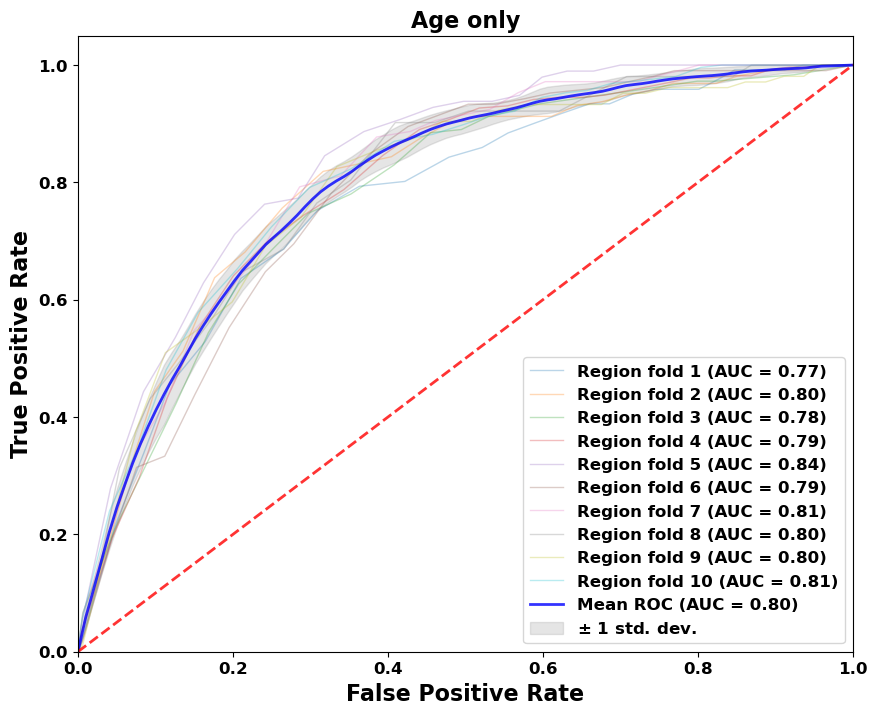

In [29]:
# Specify the directory path
directory_path = '../results/age_only/'

save_labels_probas(directory_path, train_labels_l, train_probas_l, test_labels_l, test_probas_l)


train_df = pd.concat(train_res_l, axis=1).T
train_df.to_csv(f'{directory_path}/training_results.csv')

test_df = pd.concat(test_res_l, axis=1).T
test_df.to_csv(f'{directory_path}/test_results.csv')

ml_utils.mean_roc_curve(f'{directory_path}/roc_curve', image_format='pdf', true_labels_list=test_labels_l, predicted_probs_list=test_probas_l, individual_label='Region fold', title='Age only')

In [19]:
train_df

,auroc,avg_prec,threshold,TP,TN,FP,FN,accuracy,bal_acc,prec_n,prec_p,recall_n,recall_p,f1_n,f1_p
0,0.801380,0.090216,0.035784,1072.0,31548.0,15946.0,260.0,0.668087,0.734529,0.991826,0.062992,0.664252,0.062992,0.795642,0.116839
1,0.798328,0.092312,0.032211,975.0,31281.0,12856.0,318.0,0.710015,0.731393,0.989936,0.070494,0.708725,0.070494,0.826054,0.128934
2,0.801550,0.089747,0.027268,1026.0,30158.0,15257.0,245.0,0.667952,0.735646,0.991942,0.063011,0.664054,0.063011,0.795537,0.116896
3,0.800282,0.088192,0.034292,953.0,28771.0,14620.0,227.0,0.666891,0.735345,0.992172,0.061196,0.663064,0.061196,0.794900,0.113771
4,0.796537,0.088632,0.037875,1021.0,34116.0,13771.0,335.0,0.713543,0.732689,0.990276,0.069024,0.712427,0.069024,0.828682,0.126455
5,0.800367,0.091166,0.032519,1023.0,33930.0,13727.0,325.0,0.713254,0.735432,0.990512,0.069356,0.711963,0.069356,0.828450,0.127097
6,0.798340,0.089521,0.035774,1082.0,31576.0,16107.0,265.0,0.666082,0.732737,0.991677,0.062947,0.662207,0.062947,0.794125,0.116746
7,0.799154,0.090220,0.029310,1061.0,35146.0,14234.0,341.0,0.712989,0.734261,0.990391,0.069369,0.711746,0.069369,0.828261,0.127089
8,0.799440,0.091338,0.038505,1019.0,33530.0,13516.0,330.0,0.713896,0.734041,0.990254,0.070107,0.712707,0.070107,0.828863,0.128305
9,0.798008,0.086082,0.028324,959.0,28869.0,14559.0,240.0,0.668385,0.732294,0.991755,0.061799,0.664755,0.061799,0.795980,0.114734
